In [1]:
!pwd

/home/yangliu/project/diabetic-retinopathy-detection


In [2]:
!ls

diabetic.ipynb		  heatmap.py	 resnet.pyc	  untitled.py
diabetic_or.ipynb	  preprocess.py  tensoboard_logs  vgg.py
diabetic_recovered.ipynb  resnet.py	 train.py


In [5]:
import os
import pandas as pd
import numpy as np
#from medpy.io import load
from matplotlib import pyplot as plt
import glob
import scipy
import cv2
import random
from scipy.misc import imread
import matplotlib.image as mpimg
#from multiprocess import Pool
import time
import multiprocessing
from multiprocessing import Pool


%matplotlib inline

In [6]:
!ls ../../../../media/data/yangliu/train/train

10003_left.jpeg   19968_left.jpeg   3000_left.jpeg    39975_left.jpeg
10003_right.jpeg  19968_right.jpeg  3000_right.jpeg   39975_right.jpeg
10007_left.jpeg   19970_left.jpeg   30012_left.jpeg   39978_left.jpeg
10007_right.jpeg  19970_right.jpeg  30012_right.jpeg  39978_right.jpeg
10009_left.jpeg   19972_left.jpeg   30015_left.jpeg   39981_left.jpeg
10009_right.jpeg  19972_right.jpeg  30015_right.jpeg  39981_right.jpeg
1000_left.jpeg	  19975_left.jpeg   30016_left.jpeg   39982_left.jpeg
1000_right.jpeg   19975_right.jpeg  30016_right.jpeg  39982_right.jpeg
10010_left.jpeg   19976_left.jpeg   30017_left.jpeg   39983_left.jpeg
10010_right.jpeg  19976_right.jpeg  30017_right.jpeg  39983_right.jpeg
10013_left.jpeg   19979_left.jpeg   30018_left.jpeg   39984_left.jpeg
10013_right.jpeg  19979_right.jpeg  30018_right.jpeg  39984_right.jpeg
10014_left.jpeg   1997_left.jpeg    3001_left.jpeg    39986_left.jpeg
10014_right.jpeg  1997_right.jpeg   3001_right.jpeg   39986_right.jpeg
10015_left.jpe

15206_right.jpeg  25205_right.jpeg  35288_right.jpeg  5257_right.jpeg
15208_left.jpeg   25207_left.jpeg   35290_left.jpeg   5258_left.jpeg
15208_right.jpeg  25207_right.jpeg  35290_right.jpeg  5258_right.jpeg
1520_left.jpeg	  25209_left.jpeg   35293_left.jpeg   5259_left.jpeg
1520_right.jpeg   25209_right.jpeg  35293_right.jpeg  5259_right.jpeg
15210_left.jpeg   25210_left.jpeg   35295_left.jpeg   525_left.jpeg
15210_right.jpeg  25210_right.jpeg  35295_right.jpeg  525_right.jpeg
15211_left.jpeg   25212_left.jpeg   35297_left.jpeg   5260_left.jpeg
15211_right.jpeg  25212_right.jpeg  35297_right.jpeg  5260_right.jpeg
15216_left.jpeg   25217_left.jpeg   35298_left.jpeg   5267_left.jpeg
15216_right.jpeg  25217_right.jpeg  35298_right.jpeg  5267_right.jpeg
15217_left.jpeg   2521_left.jpeg    352_left.jpeg     5274_left.jpeg
15217_right.jpeg  2521_right.jpeg   352_right.jpeg    5274_right.jpeg
15218_left.jpeg   25221_left.jpeg   35301_left.jpeg   5275_left.jpeg
15218_right.jpeg  25221_right.

In [7]:
!pwd

/home/yangliu/project/diabetic-retinopathy-detection


In [8]:
rootDir = "../../../../media/data/yangliu/train/train"
# rootDir = "/Users/yangliu/Desktop/ga_new_cap/"
ls_file = []
for root, dirs, files in os.walk(rootDir):
    for fileName in files:
        if fileName.endswith('.jpeg'):
            ls_file.append(fileName)

In [29]:
'''
Dir256 = "/home/ubuntu/Yang_Sahana/256_train/"
# rootDir = "/Users/yangliu/Desktop/ga_new_cap/"
ls_file256 = []
for root, dirs, files in os.walk(Dir256):
    for fileName in files:
        if fileName.endswith('.data'):
            ls_file256.append(fileName)

In [9]:
len(ls_file)

35126

In [10]:
ls_file[0]

'9123_right.jpeg'

In [11]:
img1 = mpimg.imread('../../../../media/data/yangliu/train/train/' + ls_file[0])
img2 = mpimg.imread('../../../../media/data/yangliu/train/train/' + ls_file[2])
# img1 =mpimg.imread('ga_new_cap/sample/' + ls_file[0])
# img2 = mpimg.imread('ga_new_cap/sample/' + ls_file[2])

In [12]:
img1.dtype

dtype('uint8')

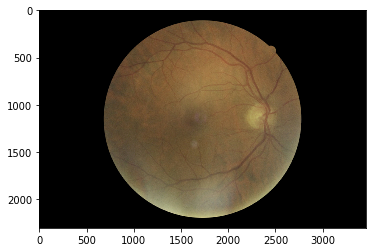

In [38]:
plt.imshow(img1)

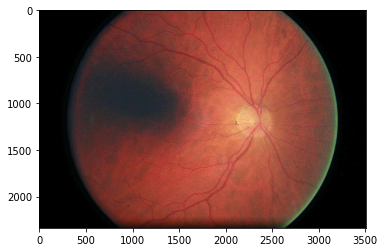

In [39]:
plt.imshow(img2)

In [40]:
img1.shape

(2304, 3456, 3)

In [41]:
img2.shape

(2336, 3504, 3)

In [42]:
# im_axis_mean = np.mean(np.sum(np.sum(img1, axis=0), axis=1))
# im_axis_mean

In [62]:
def find_border_dynamic_threshold(image, axis):
    im_array = np.sum(np.sum(image, axis=axis), axis=1)
    threshold = im_array.max() /20
    indices = np.where(im_array > threshold)
    return indices[0][0], indices[0][-1]

def crop_img(img):
# finding min max indices
    min_x, max_x = find_border_dynamic_threshold(img, 0)
    min_y, max_y = find_border_dynamic_threshold(img, 1)
# crop
    image = img[min_y:max_y, min_x:max_x]
    return image

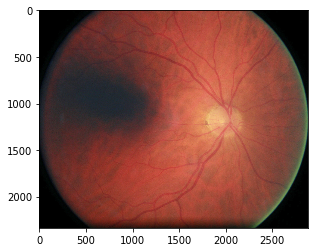

In [65]:
plt.imshow(crop_img(img2))

In [19]:
# def find_border_meansd_threshold(image, axis):
#     im_array = np.sum(np.sum(image, axis=axis), axis=1)
#     im_axis_mean = np.mean(np.sum(np.sum(image, axis= axis), axis=1))
#     im_axis_std = np.std(np.sum(np.sum(image, axis= axis), axis=1))
#     threshold = (im_axis_mean) * 0.05
#     indices = np.where(im_array > threshold)
#     return indices[0][0], indices[0][-1]

# def crop_std_img(img):
# # finding min max indices
#     min_x, max_x = find_border_meansd_threshold(img, 0)
#     min_y, max_y = find_border_meansd_threshold(img, 1)
# # crop
#     image = img[min_y:max_y, min_x:max_x]
#     return image

In [56]:
'''
def crop_borders(img_path, threshold=0.001):
    img = imread(img_path)
    rgb_added = img.sum(axis=2)
    mean_px = rgb_added.mean()
    std_px = rgb_added.std()
    col_sum = rgb_added.sum(axis=0)
    row_sum = rgb_added.sum(axis=1)
    thresh_val = (mean_px)*threshold
    col_index = np.where(col_sum > thresh_val*col_sum.shape[0])
    row_index = np.where(row_sum > thresh_val*row_sum.shape[0])
    hstart, hend = col_index[0][0], col_index[0][-1]
    wstart, wend = row_index[0][0], row_index[0][-1]
    return img[wstart:wend, hstart:hend]
'''

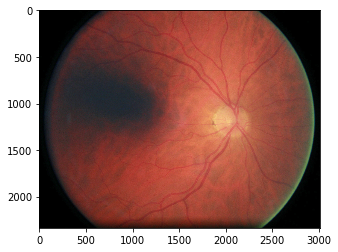

In [57]:
#crop different sizes
#plt.imshow(crop_borders('../../../../media/data/yangliu/train/train/' + ls_file[2], threshold=0.005))

In [59]:
l = range(len(ls_file))

In [60]:
rnd_idx = random.sample(l, 10)

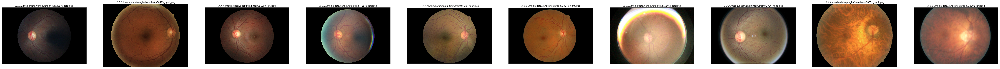

In [61]:
fig, ax = plt.subplots(nrows=1, ncols=10, figsize=(100, 100))
ax = ax.ravel()
for idx, item in enumerate(rnd_idx):
    ax[idx].imshow(imread('../../../../media/data/yangliu/train/train/' + ls_file[item]))
    ax[idx].set_title('../../../../media/data/yangliu/train/train/' + ls_file[item])
    ax[idx].set_xticks([])
    ax[idx].set_yticks([])

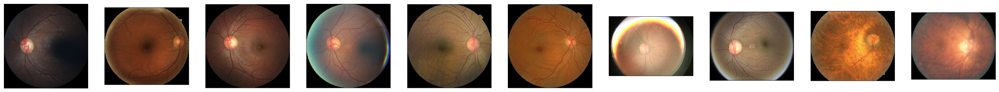

In [68]:
fig, ax = plt.subplots(nrows=1, ncols=10, figsize=(50, 50))
ax = ax.ravel()
for idx, item in enumerate(rnd_idx):
    ax[idx].imshow(crop_img(mpimg.imread('../../../../media/data/yangliu/train/train/' + ls_file[item])))
    ax[idx].set_xticks([])
    ax[idx].set_yticks([])

In [26]:
test_rootDir = "/home/ubuntu/Yang_Sahana/test/"
# rootDir = "/Users/yangliu/Desktop/ga_new_cap/"
ls_test_file = []
for root, dirs, files in os.walk(test_rootDir):
    for fileName in files:
        if fileName.endswith('.jpeg'):
            ls_test_file.append(fileName)

In [56]:
lt = range(len(ls_test_file))
rnd_idx = random.sample(lt, 10)

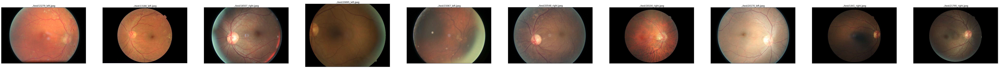

In [57]:
fig, ax = plt.subplots(nrows=1, ncols=10, figsize=(100, 100))
ax = ax.ravel()
for idx, item in enumerate(rnd_idx):
    ax[idx].imshow(imread('../test/' + ls_test_file[item]))
    ax[idx].set_title('../test/' + ls_test_file[item])
    ax[idx].set_xticks([])
    ax[idx].set_yticks([])

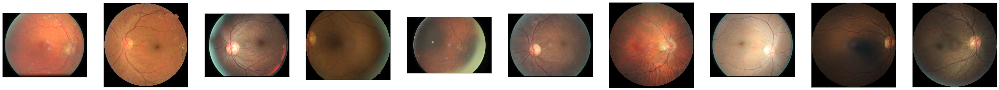

In [58]:
fig, ax = plt.subplots(nrows=1, ncols=10, figsize=(50, 50))
ax = ax.ravel()
for idx, item in enumerate(rnd_idx):
    ax[idx].imshow(crop_borders('../test/' + ls_test_file[item], 0.001))
    ax[idx].set_xticks([])
    ax[idx].set_yticks([])

333 3231
863 4045
346 3581
127 2432
289 3638
184 2588
871 3859
313 3601
892 3857
897 3835


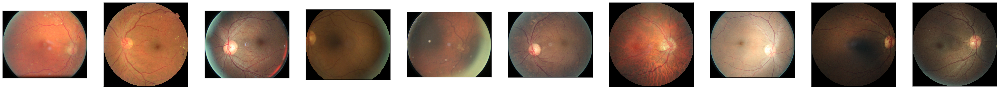

In [59]:
fig, ax = plt.subplots(nrows=1, ncols=10, figsize=(50, 50))
ax = ax.ravel()
for idx, item in enumerate(rnd_idx):
    ax[idx].imshow(crop_img(mpimg.imread('../test/' + ls_test_file[item])))
    ax[idx].set_xticks([])
    ax[idx].set_yticks([])

In [ ]:
# fig, ax = plt.subplots(nrows=1, ncols=10, figsize=(50, 50))
# ax = ax.ravel()
# for idx in range(10):
#     ax[idx].imshow(crop_borders(ls_file[idx]))
#     ax[idx].set_xticks([])
#     ax[idx].set_yticks([])

In [45]:
#reshape after crop
def reshape_img(filename, dimension): 
#     img = mpimg.imread('/Users/yangliu/Desktop/ga_new_cap/sample/' + filename)
#     img = mpimg.imread('/home/ubuntu/Yang_Sahana/train/' + filename) 
    image = cv2.resize(crop_img(mpimg.imread('../../../../media/data/yangliu/train/train/' + filename)),(dimension,dimension))
    return image

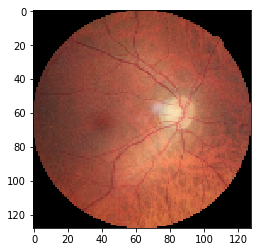

In [71]:
#plot after crop and resize
plt.imshow(reshape_img(ls_file[10],128))

In [73]:
reshape_img(ls_file[10],128).shape

(128, 128, 3)

In [77]:
#create .data file for different sizes
def memap_arry(*args): #img_file,dimension
    #create memmap object
    #begin = time.time()
    #print "Started:", char
    img_file = args[0]
    dimension = args[1]
#     print dimentsion
    tmp_char_array = reshape_img(img_file, dimension)
#     char_mmap = np.memmap(dtype='float64', filename= '/Users/yangliu/Desktop/ga_new_cap/' + str(dimension) + '_train/' + img_file.split('.')[0] +'.data', mode='w+', shape=tmp_char_array.shape)
#     char_mmap[:, :] = tmp_char_array
#     char_mmap_path = '/Users/yangliu/Desktop/ga_new_cap/'+ str(dimension) + '_train/' + img_file.split('.')[0] +'.data' #hard codes foler name
    char_mmap = np.memmap(dtype='uint8', filename= '../../../../media/data/yangliu/train/' + str(dimension) + '_train/' + img_file.split('.')[0] +'.data', mode='w+', shape=tmp_char_array.shape)
    char_mmap[:, :] = tmp_char_array
    char_mmap_path = '../../../../media/data/yangliu/train/'+ str(dimension) + '_train/' + img_file.split('.')[0] +'.data' #hard codes foler name

In [131]:
ls ../../../../media/data/yangliu/train/256_train/

10003_left.data   19968_left.data   3000_left.data    39975_left.data
10003_right.data  19968_right.data  3000_right.data   39975_right.data
10007_left.data   19970_left.data   30012_left.data   39978_left.data
10007_right.data  19970_right.data  30012_right.data  39978_right.data
10009_left.data   19972_left.data   30015_left.data   39981_left.data
10009_right.data  19972_right.data  30015_right.data  39981_right.data
1000_left.data    19975_left.data   30016_left.data   39982_left.data
1000_right.data   19975_right.data  30016_right.data  39982_right.data
10010_left.data   19976_left.data   30017_left.data   39983_left.data
10010_right.data  19976_right.data  30017_right.data  39983_right.data
10013_left.data   19979_left.data   30018_left.data   39984_left.data
10013_right.data  19979_right.data  30018_right.data  39984_right.data
10014_left.data   1997_left.data    3001_left.data    39986_left.data
10014_right.data  1997_right.data   3001_right.data   39986_right.data
10015_left.da

14921_right.data  24936_right.data  34990_right.data  4973_right.data
14923_left.data   24941_left.data   34991_left.data   497_left.data
14923_right.data  24941_right.data  34991_right.data  497_right.data
14924_left.data   24944_left.data   34992_left.data   4980_left.data
14924_right.data  24944_right.data  34992_right.data  4980_right.data
14927_left.data   24946_left.data   34994_left.data   4984_left.data
14927_right.data  24946_right.data  34994_right.data  4984_right.data
1492_left.data    24948_left.data   34995_left.data   4985_left.data
1492_right.data   24948_right.data  34995_right.data  4985_right.data
14933_left.data   24949_left.data   34996_left.data   4987_left.data
14933_right.data  24949_right.data  34996_right.data  4987_right.data
14935_left.data   24953_left.data   34997_left.data   498_left.data
14935_right.data  24953_right.data  34997_right.data  498_right.data
14936_left.data   24954_left.data   34999_left.data   4990_left.data
14936_right.data  24954_right.d

In [97]:
!rm ../../../../media/data/yangliu/train/128_train/*

In [98]:
#manually create 3 directories 128,256,512, not doing this for now!
#start with 128
# for i in ls_file[:2]:
#     memap_arry(i, 128)
    
# for i in ls_file:
#     memap_arry(i, 256)

# for i in ls_file:
#     memap_arry(i, 512)

In [34]:
#[128 for i in range(len(ls_file))]

35126

In [116]:
# zip(ls_file[:2],[128 for i in range(len(ls_file[2]))])

[('21793_left.jpeg', 128), ('21698_right.jpeg', 128)]

In [33]:
#use Pool to multitask

In [117]:
# map(memap_arry,zip(ls_file[:2],[128 for i in range(len(ls_file[2]))]))

In [121]:
# map(lambda a: memap_arry(a[0],a[1]),zip(ls_file[:3],[128 for i in range(len(ls_file[:3]))]))

[None, None, None]

In [128]:
from pathos.multiprocessing import ProcessingPool as Pool

In [129]:
#create 3 directories 128,256,512
begin = time.time()
def concate(num):
    return zip(ls_file,[num for i in range(len(ls_file))])

#pool.map(lambda a: memap_arry(a[0],a[1]),concate(128))
def working():
    pool = Pool(multiprocessing.cpu_count())
    pool.map(lambda a: memap_arry(a[0],a[1]),concate(128))

working()

print time.time() - begin

2170.29517794


Process PoolWorker-10:
Process PoolWorker-5:
Process PoolWorker-8:
Process PoolWorker-2:
Process PoolWorker-12:
Process PoolWorker-9:
Process PoolWorker-6:
Process PoolWorker-7:
Process PoolWorker-11:
Process PoolWorker-4:
Process PoolWorker-1:
Process PoolWorker-3:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/home/yangliu/anaconda2/lib/python2.7/site-packages/multiprocess/process.py", line 258, in _bootstrap
Traceback (most recent call last):
  File "/home/yangliu/anaconda2/lib/python2.7/site-packages/multiprocess/process.py", line 258, in _bootstrap
Traceback (most recent call last):
Traceback (most recent call last):
  File "/home/yangliu/anaconda2/lib/python2.7/site-packages/multiprocess/process.py", line 258, in _bootstrap
  File "/home/yang

In [130]:
begin = time.time()
pool = Pool(multiprocessing.cpu_count())
pool.map(lambda a: memap_arry(a[0],a[1]),zip(ls_file,[256 for i in range(len(ls_file))]))#first 100
print time.time() - begin

1823.91279507


In [132]:
begin = time.time()
pool = Pool(multiprocessing.cpu_count())
pool.map(lambda a: memap_arry(a[0],a[1]),zip(ls_file,[512 for i in range(len(ls_file))]))
print time.time() - begin

2051.68838811


In [ ]:
#read in .data file

In [134]:
#np.memmap()

In [13]:
rootDir = '../../../../media/data/yangliu/train/256_train/'
train_arr = []
img = []
arr_files = os.listdir(rootDir)
for fname in arr_files:
    if fname.endswith('.data'):
        img.append(fname.split('.')[0])
        actual_file = np.fromfile(rootDir + fname, dtype='uint8').reshape((256, 256, 3))
        train_arr.append(actual_file)

In [14]:
img_df = pd.DataFrame(
    {'image': img,
     'img_arr': train_arr
    })

In [15]:
len(train_arr)

35126

In [48]:
# np.fromfile(rootDir + fname, dtype='uint8').reshape((256, 256, 3))

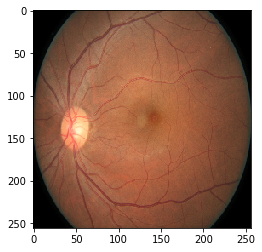

In [16]:
plt.imshow(img_df.img_arr[0])

In [5]:
# plt.imshow(image_df.pic[1])

In [ ]:
#build model for different sizes

In [115]:
!ls ../../../../media/data/yangliu/

sample	sampleSubmission.csv.zip  test	train  trainLabels.csv


In [17]:
labels = pd.read_csv('../../../../media/data/yangliu/trainLabels.csv')

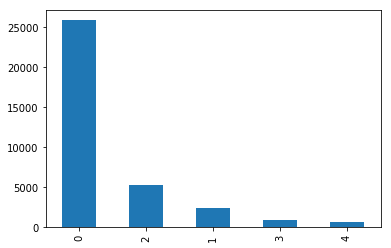

In [18]:
labels['level'].value_counts().plot(kind='bar')

In [19]:
len(labels['level'] == 0)/float(len(labels))

1.0

In [20]:
labels.head()

,image,level
0,10_left,0
1,10_right,0
2,13_left,0
3,13_right,0
4,15_left,1


In [21]:
result = pd.merge(img_df, labels, on = ['image'])
label = pd.get_dummies(result.level)
result1 = result.join(label)
result1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35126 entries, 0 to 35125
Data columns (total 8 columns):
image      35126 non-null object
img_arr    35126 non-null object
level      35126 non-null int64
0          35126 non-null uint8
1          35126 non-null uint8
2          35126 non-null uint8
3          35126 non-null uint8
4          35126 non-null uint8
dtypes: int64(1), object(2), uint8(5)
memory usage: 2.5+ MB


In [22]:
result1.img_arr[0].shape

(256, 256, 3)

In [8]:
# plt.imshow(result1.pic_arr[0])

In [23]:
#from keras.utils.np_utils import to_categorical
from keras.applications.vgg16 import VGG16
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input
from keras.applications.vgg16 import decode_predictions, preprocess_input
from keras.callbacks import ModelCheckpoint, TensorBoard, EarlyStopping
from keras.layers import Input, Flatten, Dense
from keras.models import Model

Using Theano backend.


In [24]:
#Get back the convolutional part of a VGG network trained on ImageNet
model_vgg16_conv = VGG16(weights='imagenet', include_top=False)
# model_vgg16_conv.summary()

input = Input(shape=(256,256,3),name = 'image_input')

#Use the generated model 
output_vgg16_conv = model_vgg16_conv(input)

#Add the fully-connected layers 
x = Flatten(name='flatten')(output_vgg16_conv)
x = Dense(4096, activation='relu', name='fc1')(x)
x = Dense(4096, activation='relu', name='fc2')(x)
x = Dense(5, activation='softmax', name='predictions')(x)
 
my_model = Model(input=input, output=x)

#In the summary, weights and layers from VGG part will be hidden, but they will be fit during the training
my_model.summary()

/home/yangliu/anaconda2/envs/tensorflow_gpu/lib/python2.7/site-packages/ipykernel/__main__.py:16: UserWarning: Update your `Model` call to the Keras 2 API: `Model(outputs=Softmax.0, inputs=/image_inp...)`


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
image_input (InputLayer)     (None, 256, 256, 3)       0         
_________________________________________________________________
vgg16 (Model)                multiple                  14714688  
_________________________________________________________________
flatten (Flatten)            (None, 32768)             0         
_________________________________________________________________
fc1 (Dense)                  (None, 4096)              134221824 
_________________________________________________________________
fc2 (Dense)                  (None, 4096)              16781312  
_________________________________________________________________
predictions (Dense)          (None, 5)                 20485     
Total params: 165,738,309
Trainable params: 165,738,309
Non-trainable params: 0
______________________________________________________________

In [36]:
from keras.applications.vgg19 import VGG19
from keras.optimizers import SGD
def VGGNet_model(input_shape, num_classes, use_sgd=False, train_bottom=False):
    model_vgg19_conv = VGG19(weights='imagenet', include_top=False)
    model_vgg19_conv.summary()
    
    if not train_bottom: 
        for layer in model_vgg19_conv.layers:
            layer.trainable = False

    # Create your own input format
    input = Input(shape=input_shape, name = 'image_input')
    
    # Use the generated model 
    output_vgg19_conv = model_vgg19_conv(input)
  
    
    # Add the fully-connected layers 
    x = Flatten(name='flatten')(output_vgg19_conv)
    x = Dense(4096, activation='relu', name='fc1')(x)
    x = Dense(4096, activation='relu', name='fc2')(x)
    x = Dense(1000, activation='relu', name='fc3')(x)

    x = Dense(num_classes, activation='softmax', name='predictions')(x)
    
    # Create model 
    AD_model = Model(input=input, output=x)
    AD_model.summary()

    # Compile model
    if not use_sgd:
        AD_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
        print "using adam optimizer"
    else:
        sgd = SGD(lr=0.01, momentum=0.8, decay=0.000001, nesterov=False)
        AD_model.compile(loss='binary_crossentropy', optimizer=sgd, metrics=[ 'accuracy' ])
        print "using SGD optimizer"
    
    return AD_model

In [37]:
vgg_model= VGGNet_model((256,256,3), 5, use_sgd=True, train_bottom=True)

79618048/80134624 [============================>.] - ETA: 0s_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, None, None, 3)     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (Max

/home/yangliu/anaconda2/envs/tensorflow_gpu/lib/python2.7/site-packages/ipykernel/__main__.py:27: UserWarning: Update your `Model` call to the Keras 2 API: `Model(outputs=Softmax.0, inputs=/image_inp...)`


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
image_input (InputLayer)     (None, 256, 256, 3)       0         
_________________________________________________________________
vgg19 (Model)                multiple                  20024384  
_________________________________________________________________
flatten (Flatten)            (None, 32768)             0         
_________________________________________________________________
fc1 (Dense)                  (None, 4096)              134221824 
_________________________________________________________________
fc2 (Dense)                  (None, 4096)              16781312  
_________________________________________________________________
fc3 (Dense)                  (None, 1000)              4097000   
_________________________________________________________________
predictions (Dense)          (None, 5)                 5005      
Total para

In [42]:
!cd tensoboard_logs/

In [43]:
!pwd

/home/yangliu/project/diabetic-retinopathy-detection


In [44]:
# Create model checkpoints
from keras.callbacks import ModelCheckpoint, TensorBoard, EarlyStopping
vgg_tboard_dr = TensorBoard(log_dir='tensoboard_logs/vgg_dr')
vgg_model_check_dr = ModelCheckpoint(filepath='vgg_dr', monitor='val_acc', save_best_only=True)
early_stopping = EarlyStopping(monitor='val_acc', patience=5)

RuntimeError: TensorBoard callback only works with the TensorFlow backend.

In [30]:
# from skimage.color import rgb2gray
# from sklearn.preprocessing import OneHotEncoder
# enc = OneHotEncoder()
#  = np.array(result1.pic_arr)
x_train = np.concatenate([arr[np.newaxis] for arr in result1.img_arr])
# x_train = result1.pic_arr.values.ravel()
x_train = x_train.reshape((-1, 256, 256, 3))
# x_test = gray2rgb(img2.get_data()[:,:,90])[np.newaxis, : , :, :]
y_train = result1.iloc[:,3:].values
# y_train = np.array([1, 0, 0]).reshape(1, 3)

In [32]:
result1.img_arr.shape

(35126,)

In [33]:
x_train.shape

(35126, 256, 256, 3)

In [45]:
vgg_model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
# Create model checkpoints
#vgg_tboard_dr = TensorBoard(log_dir='tensoboard_logs/vgg_dr')
#vgg_model_check_dr = ModelCheckpoint(filepath='vgg_dr', monitor='val_acc', save_best_only=True)
#early_stopping = EarlyStopping(monitor='val_acc', patience=5)
vgg_model.fit(x_train, y_train, validation_split=0.1, epochs=5, batch_size=20)

Train on 31613 samples, validate on 3513 samples
Epoch 1/5
  260/31613 [..............................] - ETA: 80974s - loss: 1.6709 - acc: 0.8769

KeyboardInterrupt: 

In [46]:
from keras.models import Model
from keras.optimizers import SGD
from keras.models import Sequential 
from sklearn.utils import shuffle
from keras.applications import ResNet50
from keras.applications import imagenet_utils
from keras.layers import Dense, Activation, Flatten, BatchNormalization, Dropout
from keras.layers import merge
from keras.layers.convolutional import Convolution2D, MaxPooling2D, ZeroPadding2D, AveragePooling2D

In [47]:
def ResNet_model(input_shape, num_classes, use_sgd=False):
    model_resnet_conv = ResNet50(weights='imagenet', include_top=False)
    
#    for layer in model_vgg16_conv.layers:
#        layer.trainable = False

    # Create your own input format
    input = Input(shape=input_shape, name = 'image_input')
    
    # Use the generated model 
    output_resnet_conv = model_resnet_conv(input)
    
    # Add the fully-connected layers 
    x = Flatten(name='flatten')(output_resnet_conv)
    x = Dense(4096, activation='relu', name='fc1')(x)
    x = Dense(4096, activation='relu', name='fc2')(x)

    x = Dense(num_classes, activation='softmax', name='predictions')(x)
    
    # Create model 
    AD_model = Model(input=input, output=x)
    AD_model.summary()

    # Compile model
    if not use_sgd:
        AD_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
        print "using adam optimizer"
    else:
        sgd = SGD(lr=0.01, momentum=0.8, decay=0.000001, nesterov=False)
        AD_model.compile(loss='binary_crossentropy', optimizer=sgd, metrics=[ 'accuracy' ])
        print "using SGD optimizer"
    
    return AD_model

In [48]:
resnet_model = ResNet_model((256,256,3), 5, use_sgd=True)

94502912/94653016 [============================>.] - ETA: 0s

/home/yangliu/anaconda2/envs/tensorflow_gpu/lib/python2.7/site-packages/ipykernel/__main__.py:21: UserWarning: Update your `Model` call to the Keras 2 API: `Model(outputs=Softmax.0, inputs=/image_inp...)`


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
image_input (InputLayer)     (None, 256, 256, 3)       0         
_________________________________________________________________
resnet50 (Model)             multiple                  23587712  
_________________________________________________________________
flatten (Flatten)            (None, 2048)              0         
_________________________________________________________________
fc1 (Dense)                  (None, 4096)              8392704   
_________________________________________________________________
fc2 (Dense)                  (None, 4096)              16781312  
_________________________________________________________________
predictions (Dense)          (None, 5)                 20485     
Total params: 48,782,213
Trainable params: 48,729,093
Non-trainable params: 53,120
___________________________________________________________

In [50]:
from keras.preprocessing.image import ImageDataGenerator
data_aug = ImageDataGenerator(width_shift_range=0.25, height_shift_range=0.25, horizontal_flip=True, zoom_range=.25)
data_aug.fit(x_train)

In [ ]:
resnet_model.fit_generator(data_aug.flow(x_train, y_train, batch_size=15), 
                             steps_per_epoch=x_train.shape[0] / 15, epochs=10)

Epoch 1/10
   8/2341 [..............................] - ETA: 60179s - loss: 0.3611 - acc: 0.8633

In [90]:
def plot_tiles(arr, figsize=(15, 15)):
    n = arr.shape[0]
    fig, ax = plt.subplots(1, n, figsize=figsize)
    ax = ax.ravel()
    for i in range(n):
        ax[i].imshow(arr[i])
        ax[i].set_xticks([])
        ax[i].set_yticks([])

In [97]:
from vis.utils import utils
from vis.visualization import visualize_cam, overlay

In [106]:
def attention_dia(idx):
    pre_img = x_train[idx]
    filter_idx = np.argmax(my_model.predict(pre_img[np.newaxis]))
    
    ## this function is doing the magic 
    ## it's just a fancy way of taking the derivative of the image w.r.t. that softmax
    heatmap = visualize_cam(my_model, layer_idx, filter_indices=filter_idx, seed_input=pre_img, backprop_modifier='guided')
    
    return overlay(churches[idx], heatmap)

In [108]:
num_idx = 5
layer_idx = utils.find_layer_idx(my_model, 'predictions')
dia_idx = random.sample(range(100), 10)
dia_attention_maps = np.array(map(attention_dia, dia_idx))

ValueError: Unable to determine penultimate `Conv` or `Pooling` layer for layer_idx: 5

In [ ]:
plot_tiles(dia_attention_maps)

In [15]:
from keras.models import Model
from keras.models import Sequential 
from sklearn.utils import shuffle
from keras.applications import ResNet50
from keras.applications import imagenet_utils
from keras.layers import Dense, Activation, Flatten, BatchNormalization, Dropout
from keras.layers import merge
from keras.layers.convolutional import Convolution2D, MaxPooling2D, ZeroPadding2D, AveragePooling2D

In [63]:
resnet_model = ResNet50(weights='imagenet')

102383616/102853048 [============================>.] - ETA: 0s

In [64]:
inputShape = (256, 256)
preprocess = imagenet_utils.preprocess_input

In [84]:
# our input image is now represented as a NumPy array of shape
# (inputShape[0], inputShape[1], 3) however we need to expand the
# dimension by making the shape (1, inputShape[0], inputShape[1], 3)
# so we can pass it through thenetwork
image = np.expand_dims(x_train, axis=0)
# pre-process the image using the appropriate function based on the
# model that has been loaded (i.e., mean subtraction, scaling, etc.)
# image = preprocess(image)

In [109]:
# preds = model.predict(result1.pic_arr)
# P = imagenet_utils.decode_predictions(preds)

In [17]:
def resnet(input_shape=(256,256,3), nb_classes=5, optimizer='Adam', loss='binary_crossentropy'):
    '''
    34 layer resnet adaptation for variable image shapes/number of classes
    '''

    inp = Input(shape=input_shape)
    output_resnet = resnet_model(inp)
    x = Convolution2D(64, 7, 7, subsample=(2, 2), init='he_normal', name='conv1')(output_resnet)
    x = BatchNormalization(axis=1, name='bn_conv1')(x)
    x = Activation('relu')(x)
    x = MaxPooling2D((3, 3), strides=(2, 2))(x)
#   x = AveragePooling2D((7, 7))(x)
    x = Flatten()(x)
    x = Dense(nb_classes, init='he_normal', activation='softmax', name='fc10')(x)

    model = Model(inp, x)

    model.compile(
        optimizer=optimizer,
        loss=loss,
        metrics=['accuracy']
        )
    return model

In [18]:
model = resnet()

/home/ubuntu/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:7: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (7, 7), strides=(2, 2), kernel_initializer="he_normal", name="conv1")`
/home/ubuntu/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:30: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(5, activation="softmax", kernel_initializer="he_normal", name="fc10")`


In [19]:
model.fit(x_train, y_train, validation_split=0.1, epochs=5, batch_size=20)

Train on 90 samples, validate on 10 samples
Epoch 1/5
90/90 [==============================] - 3s - loss: 0.3956 - acc: 0.8444 - val_loss: 0.7902 - val_acc: 0.7000
Epoch 2/5
90/90 [==============================] - 3s - loss: 0.3800 - acc: 0.8267 - val_loss: 0.0928 - val_acc: 0.9600
Epoch 3/5
90/90 [==============================] - 3s - loss: 0.3209 - acc: 0.8733 - val_loss: 0.2210 - val_acc: 0.9000
Epoch 4/5
90/90 [==============================] - 3s - loss: 0.3123 - acc: 0.8622 - val_loss: 0.1032 - val_acc: 0.9800
Epoch 5/5
90/90 [==============================] - 3s - loss: 0.3350 - acc: 0.8733 - val_loss: 0.1396 - val_acc: 0.9800


In [ ]:
#     x = conv_block(x, 3, [64, 64, 256], stage=2, block='a', strides=(1, 1))
#     x = identity_block(x, 3, [64, 64, 256], stage=2, block='b')
#     x = identity_block(x, 3, [64, 64, 256], stage=2, block='c')

#     x = conv_block(x, 3, [128, 128, 512], stage=3, block='a')
#     x = identity_block(x, 3, [128, 128, 512], stage=3, block='b')
#     x = identity_block(x, 3, [128, 128, 512], stage=3, block='c')
#     x = identity_block(x, 3, [128, 128, 512], stage=3, block='d')

#     x = conv_block(x, 3, [256, 256, 1024], stage=4, block='a')
#     x = identity_block(x, 3, [256, 256, 1024], stage=4, block='b')
#     x = identity_block(x, 3, [256, 256, 1024], stage=4, block='c')
#     x = identity_block(x, 3, [256, 256, 1024], stage=4, block='d')
#     x = identity_block(x, 3, [256, 256, 1024], stage=4, block='e')
#     x = identity_block(x, 3, [256, 256, 1024], stage=4, block='f')

In [117]:
def conv_block(input_tensor, kernel_size, filters, stage, block, strides=(2, 2)):
    '''conv_block is the block that has a conv layer at shortcut
    # Arguments
        input_tensor: input tensor
        kernel_size: defualt 3, the kernel size of middle conv layer at main path
        filters: list of integers, the nb_filters of 3 conv layer at main path
        stage: integer, current stage label, used for generating layer names
        block: 'a','b'..., current block label, used for generating layer names
    Note that from stage 3, the first conv layer at main path is with subsample=(2,2)
    And the shortcut should have subsample=(2,2) as well
    '''
    nb_filter1, nb_filter2, nb_filter3 = filters
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    out = BatchNormalization(axis=1, name=bn_name_base + '2a')(input_tensor)
    out = Activation('relu')(out)
    out = Convolution2D(nb_filter1, 1, 1, init='he_normal', subsample=strides, name=conv_name_base + '2a')(out)

    out = BatchNormalization(axis=1, name=bn_name_base + '2b')(out)
    out = Activation('relu')(out)
    out = Convolution2D(nb_filter2, kernel_size, kernel_size, init='he_normal', border_mode='same', name=conv_name_base + '2b')(out)

    out = BatchNormalization(axis=1, name=bn_name_base + '2c')(out)
    out = Convolution2D(nb_filter3, 1, 1, init='he_normal', name=conv_name_base + '2c')(out)

    shortcut = BatchNormalization(axis=1, name=bn_name_base + '1')(input_tensor)
    shortcut = Convolution2D(nb_filter3, 1, 1, subsample=strides, init='he_normal', name=conv_name_base + '1')(shortcut)

    out = merge([out, shortcut], mode='sum')
    return out

In [121]:
def identity_block(input_tensor, kernel_size, filters, stage, block):
    '''The identity_block is the block that has no conv layer at shortcut
    # Arguments
        input_tensor: input tensor
        kernel_size: defualt 3, the kernel size of middle conv layer at main path
        filters: list of integers, the nb_filters of 3 conv layer at main path
        stage: integer, current stage label, used for generating layer names
        block: 'a','b'..., current block label, used for generating layer names
    '''
    nb_filter1, nb_filter2, nb_filter3 = filters

    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    out = BatchNormalization(axis=1, name=bn_name_base + '2a')(input_tensor)
    out = Activation('relu')(out)
    out = Convolution2D(nb_filter1, 1, 1, init='he_normal', name=conv_name_base + '2a')(out)

    out = BatchNormalization(axis=1, name=bn_name_base + '2b')(out)
    out = Activation('relu')(out)
    out = Convolution2D(nb_filter2, kernel_size, kernel_size, border_mode='same', init='he_normal', name=conv_name_base + '2b')(out)

    out = BatchNormalization(axis=1, name=bn_name_base + '2c')(out)
    out = Convolution2D(nb_filter3, 1, 1, init='he_normal', name=conv_name_base + '2c')(out)

    out = merge([out, input_tensor], mode='sum') # always merge input with output of the block to retain information before transformations?
    return out


In [ ]:
X, y = shuffle(fc2_all, [0]*500 + [1]*500)
# building logistic reg on top of 4096 vectors 
model = Sequential()
model.add(Dense(1, activation='sigmoid', input_dim=4096))
model.compile('adam', 'binary_crossentropy', metrics=['accuracy'])
model.fit(X, y, validation_split=0.1)